In [4]:
import pandas as pd
import matplotlib
import numpy as np 

import matplotlib.pyplot as plt

import seaborn as sns


import seaborn as sn
import plotly.graph_objects as go
from itertools import cycle
import matplotlib.colors as colors
import warnings, gc
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv("train_data_new.csv")

In [3]:
df = pd.DataFrame(data)
print("Number of rows and columns are:")
df.shape

Number of rows and columns are:


(99730, 191)

In [4]:
df=df[0:99729]

In [5]:
y = df["target"]

In [6]:
df.head()

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
0,00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8a...,2017-06-22,0.935854,0.003535,0.005764,0.810966,0.004223,NaN,0.000970,0.008519,...,NaN,NaN,0.005136,0.002997,0.000796,NaN,0.003694,0.007364,0.004366,0
1,0000d17a1447b25a01e42e1ac56b091bb7cbb06317be4c...,2017-08-26,1.002364,0.530086,0.079256,0.211974,0.000166,0.094156,0.001268,0.092330,...,NaN,NaN,0.004333,0.004170,0.005831,NaN,0.002061,0.002050,0.006982,0
2,0002d381bdd8048d76719042cf1eb63caf53b636f8aacd...,2017-11-21,1.004737,0.007491,0.011268,0.815235,0.004707,0.167983,0.007022,0.005782,...,NaN,NaN,0.004527,0.009969,0.007597,NaN,0.000389,0.002958,0.006377,0
3,0002e335892f7998f0feb3a59f32d652f0da7c85e535b9...,2017-06-24,0.598885,0.004561,0.006514,0.819407,0.003298,NaN,0.001530,0.005176,...,NaN,NaN,0.004920,0.001798,0.006087,NaN,0.002924,0.005213,0.006235,1
4,0003b7891c49786441d138c01f55f1712df645989dcd2a...,2017-07-25,0.947002,0.004557,0.027306,0.577117,0.002515,0.608031,0.002995,0.050082,...,NaN,NaN,0.005375,0.009746,0.002892,NaN,0.001835,0.004187,0.003114,0


In [7]:
#Dataframe for different types of variables
df_D=[c for c in df if c.startswith('D_')]
df_S=[c for c in df if c.startswith('S_')]
df_P=[c for c in df if c.startswith('P_')]
df_B=[c for c in df if c.startswith('B_')]
df_R=[c for c in df if c.startswith('R_')]

Bar Graph wrt Target

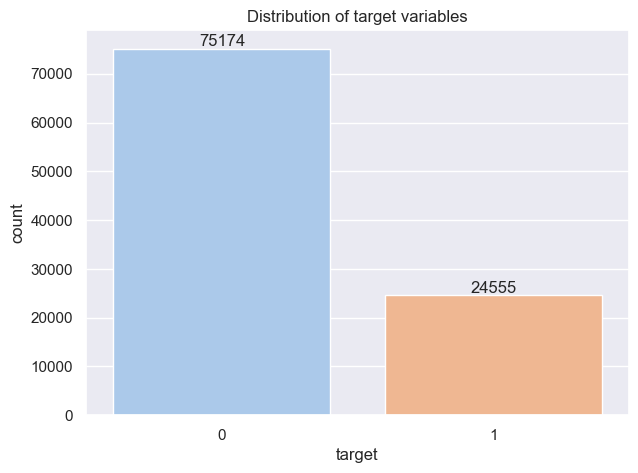

In [8]:
#bar graph for counting target 0 and 1
plt.figure(figsize = (7,5))
sns.set(font_scale=1)
ax=sns.countplot(x='target',palette="pastel",data=df[0:99730])
ax.bar_label(ax.containers[0])
plt.title("Distribution of target variables")
plt.show()


Distribution of different types of variables

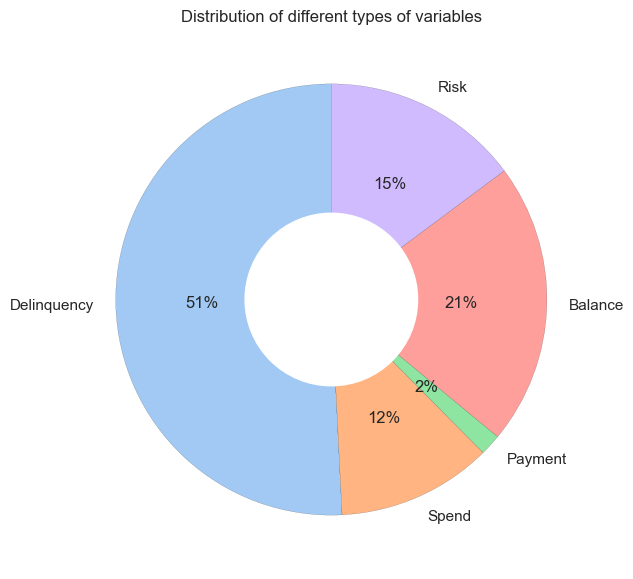

In [9]:
labels=['Delinquency', 'Spend','Payment','Balance','Risk']
c=labels
val=[len(df_D),len(df_S),len(df_P),len(df_B),len(df_R)]
explode=[0.01,0.1,0.1,0.01,0.1]
plt.figure(figsize = (10, 7))
colors = sns.color_palette("pastel",10)
plt.pie(val, labels = c,colors=colors,
        startangle=90, 
        wedgeprops={"edgecolor":"k",'linewidth': 0.1, 'antialiased': True},
        autopct='%1.0f%%')
my_circle=plt.Circle( (0,0), 0.4, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('Distribution of different types of variables')
plt.show()

Missing Values percentage bar graph for all columns

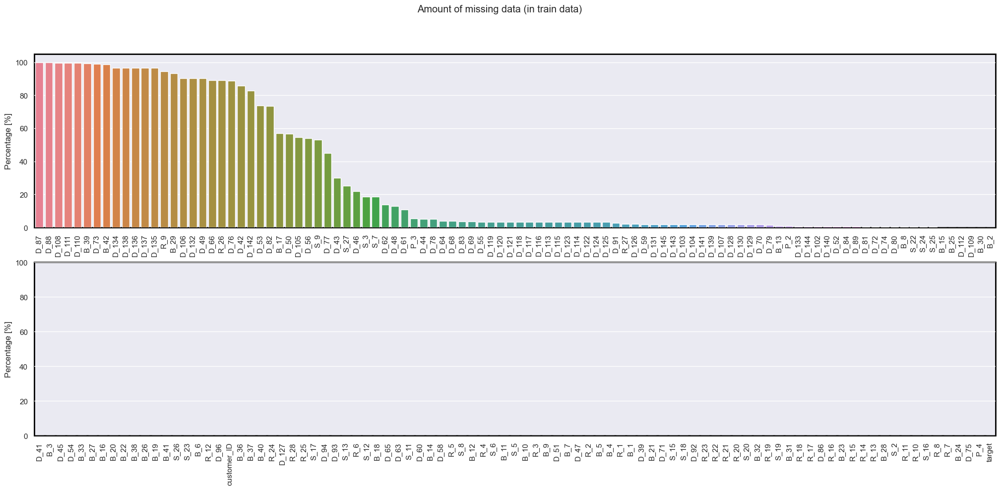

In [10]:
missing_train_data = df.isna().sum().div(len(df)).mul(100).sort_values(ascending=False)
fig, ax = plt.subplots(2,1, figsize=(25,10))
sns.set(rc={'axes.facecolor':'white','figure.facecolor':'white','grid.color':'0.8'})
sns.barplot(x=missing_train_data[:100].index, y=missing_train_data[:100].values, ax=ax[0],palette="husl")
sns.barplot(x=missing_train_data[100:].index, y=missing_train_data[100:].values, ax=ax[1])
sns.despine(bottom=True,left=True)
ax[0].set_ylabel("Percentage [%]"), ax[1].set_ylabel("Percentage [%]")
ax[0].tick_params(axis='x', rotation=90); ax[1].tick_params(axis='x', rotation=90)
ax[0].patch.set_edgecolor('black')
ax[0].patch.set_linewidth('2')
ax[1].patch.set_edgecolor('black')
ax[1].patch.set_linewidth('2')
plt.suptitle("Amount of missing data (in train data)")
plt.ylim(0,100)
plt.show()

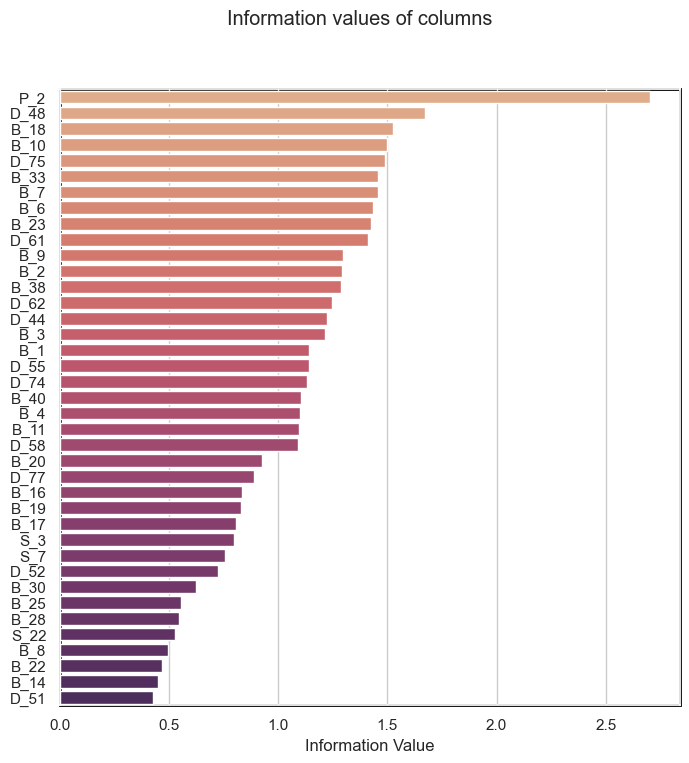

In [11]:
names=["P_2","D_48","B_18","B_10","D_75","B_33","B_7","B_6","B_23","D_61","B_9","B_2","B_38","D_62","D_44","B_3","B_1","D_55","D_74","B_40","B_4","B_11","D_58","B_20","D_77","B_16","B_19","B_17","S_3","S_7","D_52","B_30","B_25","B_28","S_22","B_8","B_22","B_14","D_51"]
infos=[2.703598378,1.671362315,1.524071276,1.498768626,1.489162254,1.457880297,1.45787019,1.43632899,1.424584056,1.410231817,1.296054319,1.293369778,1.286130602,1.247775337,1.22489961,1.216591873,1.142859171,1.139595009,1.134483885,1.10380881,1.100692684,1.096816066,1.09261231,0.924613983,0.889482469,0.833780968,0.827970332,0.808358839,0.799029142,0.756392072,0.725434397,0.622866921,0.554676804,0.54604431,0.527927362,0.4941089,0.468937139,0.452277331,0.42927929]





sns.set(rc={'axes.facecolor':'white','figure.facecolor':'white','grid.color':'0.8'})
fig=plt.figure(figsize=(8,8))
ax=sns.barplot(x=infos, y=names, orientation="horizontal",palette="flare")
ax.patch.set_edgecolor('black')
ax.patch.set_linewidth('2')
plt.xlabel("Information Value")

plt.suptitle("Information values of columns")
# plt.ylim(0,100)
plt.show()

Creating DataFrames containg a paticular typee of variable

In [12]:
#type of variable
dfb=df[df_B]
df_b=pd.DataFrame(dfb)

dfp=df[df_P]
df_p=pd.DataFrame(dfp)

dfd=df[df_D]
df_d=pd.DataFrame(dfd)

dfr=df[df_R]
df_r=pd.DataFrame(dfr)

dfs=df[df_S]
df_s=pd.DataFrame(dfs)

#Value of target
t0=df[df['target']==0]
t1=df[df['target']==1]


HeatMap for variable of each kind

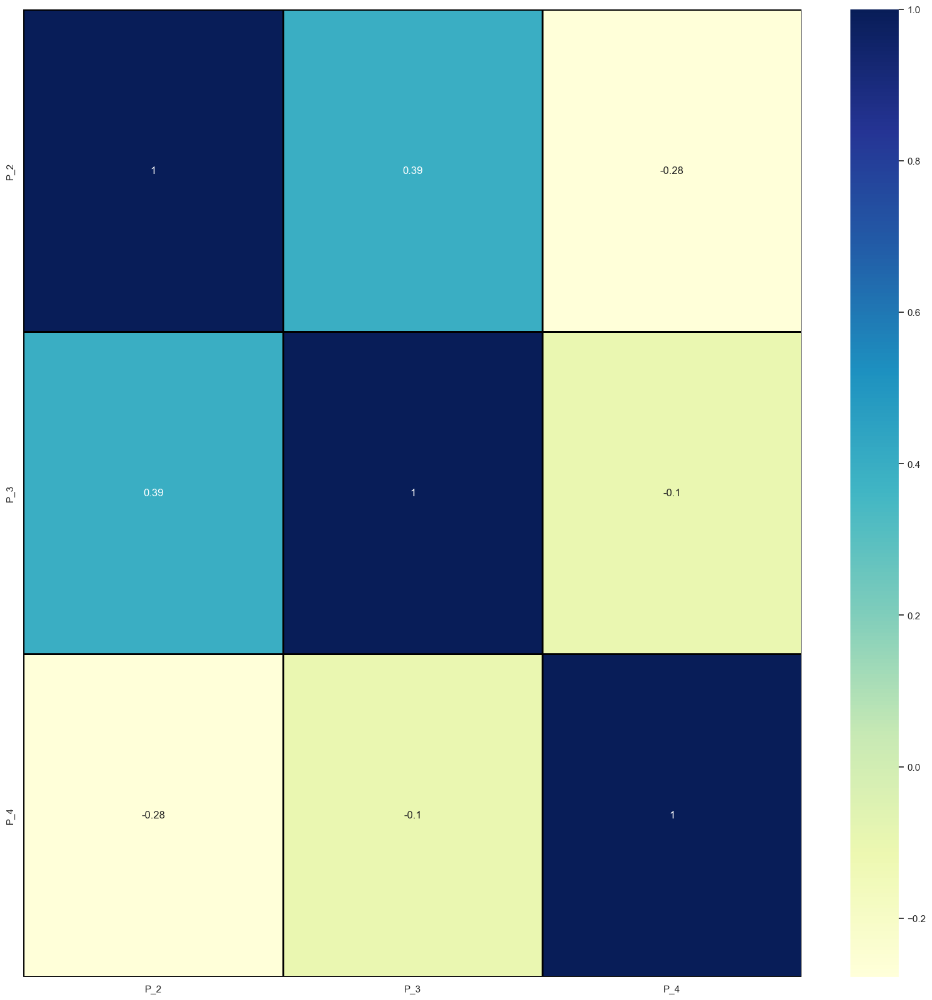

In [13]:
df_list=[df_b,df_r,df_s,df_d,df_p]

plt.figure(figsize=(20,20))
#colors = sns.color_palette("Set2",10)
sns.heatmap(df_list[4].corr(method='pearson'),
            cmap='YlGnBu',
            annot = True, linewidth=1,linecolor="black");

plt.show()

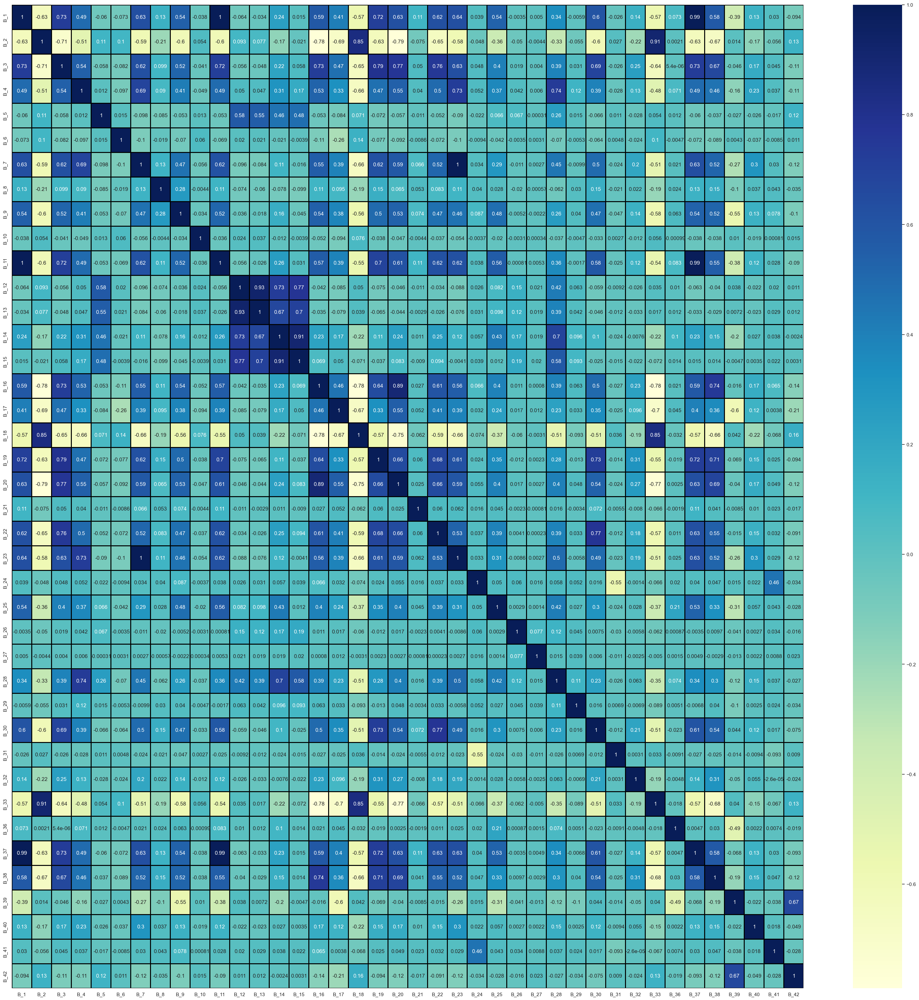

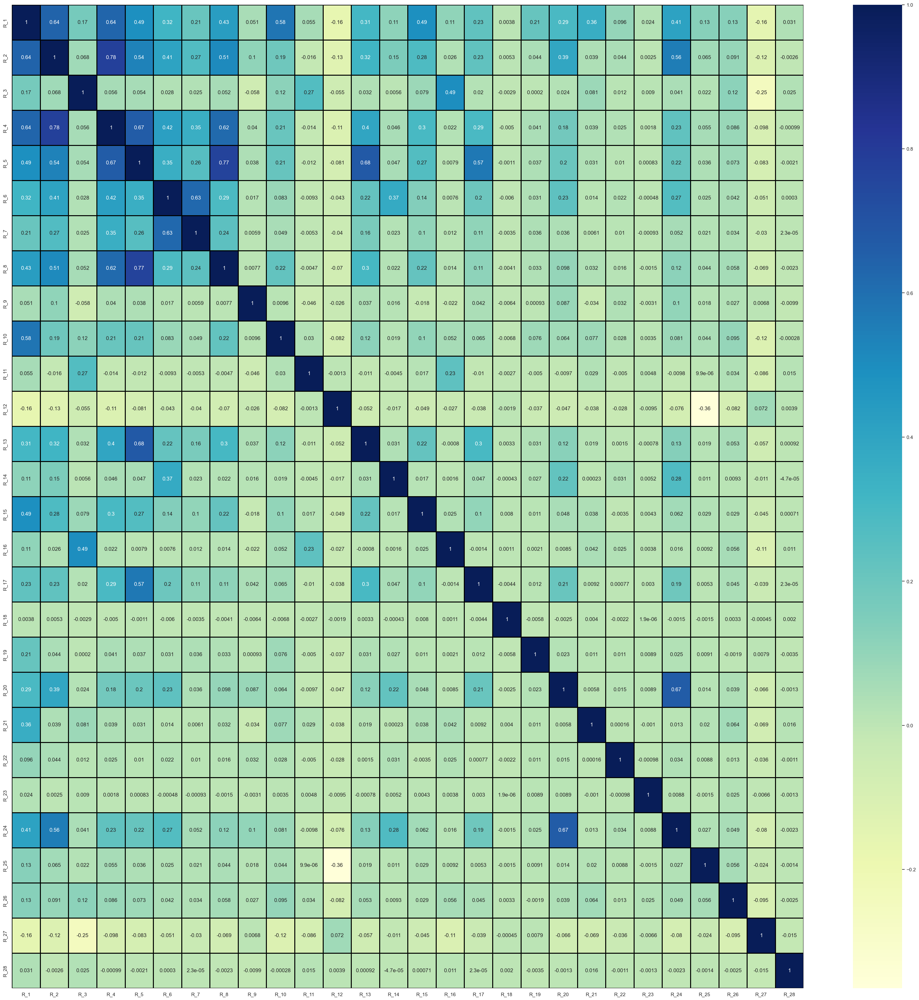

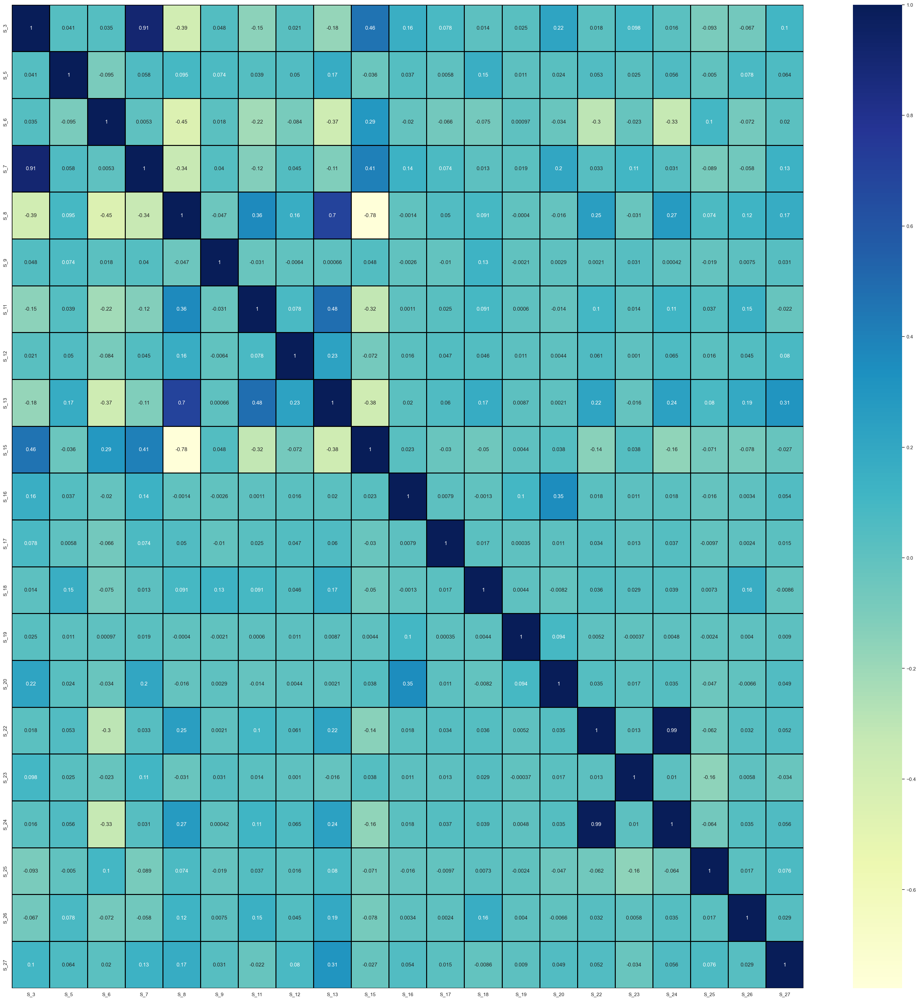

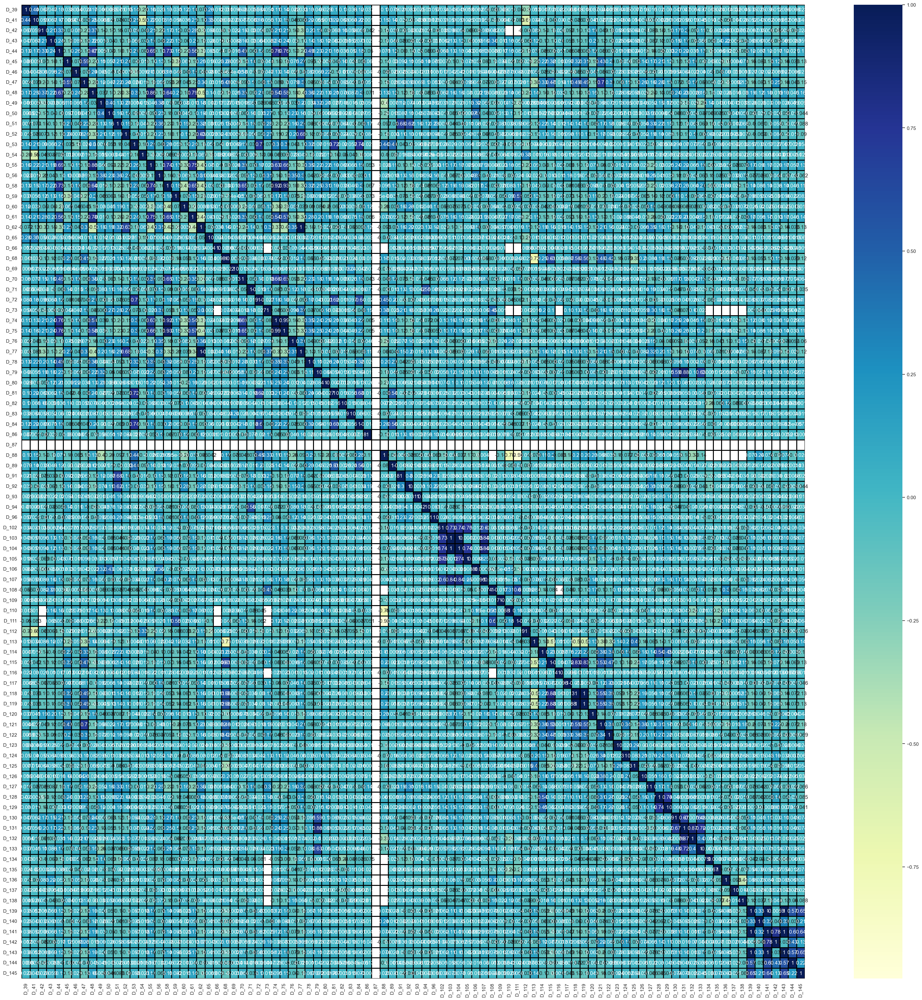

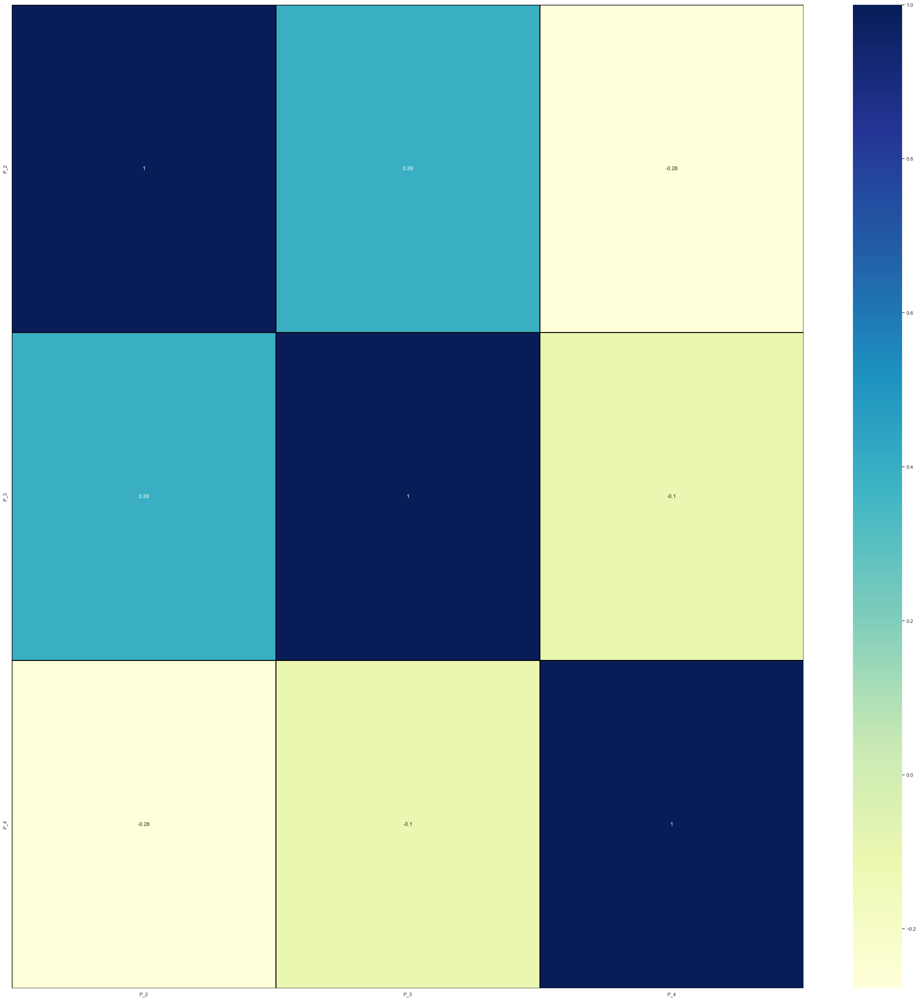

In [14]:
#CREATE
#Each category heatmap for all columns of that variable
#Top 7 iv features regardless of category


df_list=[df_b,df_r,df_s,df_d,df_p]
for i in range(5):
    plt.figure(figsize=(40,40))
    #colors = sns.color_palette("Set2",10)
    sns.heatmap(df_list[i].corr(method='pearson'),
                cmap='YlGnBu',
                annot = True, linewidth=1,linecolor="black");

    plt.show()

In [ ]:
# a=[]
# for i in range(28):
#     str2="S"
#     str3="_"
#     str4=str(i)
#     a.append(str2+str3+str4)
# print(a)

Pie chart for top 10 Info value columns

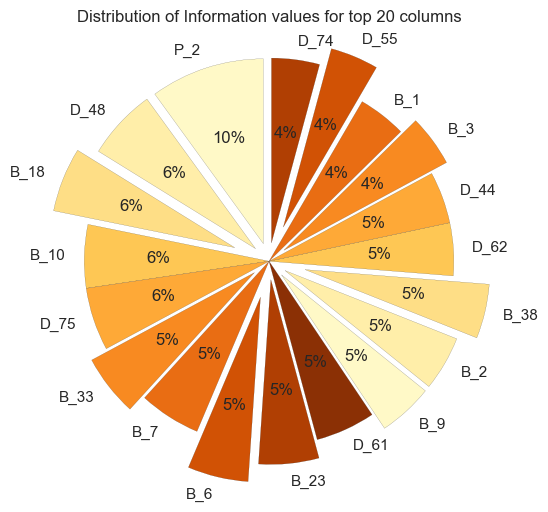

In [15]:
#Pie chart for IV and column name make for top 20 columns in final

# names=["B_42","B_18","B_2","B_33","B_9","B_17","B_16","B_22","B_30"]
# infos=[10,
# 1.555187738,
# 1.219875216,
# 1.156881893,
# 1.117928892,
# 0.823506049,
# 0.72693734,
# 0.715580039,
# 0.62286275,
# ]


names=["P_2","D_48","B_18","B_10","D_75","B_33","B_7","B_6","B_23","D_61","B_9","B_2","B_38","D_62","D_44","B_3","B_1","D_55","D_74"]
infos=[2.703598378,1.671362315,1.524071276,1.498768626,1.489162254,1.457880297,1.45787019,1.43632899,1.424584056,1.410231817,1.296054319,1.293369778,1.286130602,1.247775337,1.22489961,1.216591873,1.142859171,1.139595009,1.134483885]

explode=(0.1,0.1,0.2,0,0,0.1,0,0.2,0.1,0,0.1,0.1,0.2,0,0,0.1,0,0.2,0.1)
fig=plt.figure(figsize=(6,6))
colors = sns.color_palette("YlOrBr",10)
#explode=[0,0.1,0,0,0.1,0.1,0,0.1]
plt.pie(infos, labels = names,colors=colors,explode=explode,
        startangle=90, 
        wedgeprops={"edgecolor":"k",'linewidth': 0.1, 'antialiased': True},
        autopct='%1.0f%%')
plt.title("Distribution of Information values for top 20 columns")
plt.show()

Array for top value IV(2 per category)

In [16]:
IV_top_per_cat1=['P_2','R_3','S_7','B_10','D_44']
IV_top_per_cat2=['P_3','R_1','S_3','B_18','D_48']

Plot for frequency of number of customer statements wrt to the data of the statement. We can observe that more during weekends

In [17]:
#Frequency of customer statements

dataa = df.reset_index().groupby('S_2')['customer_ID'].nunique().reset_index()
fig = go.Figure()

fig.add_trace(
    go.Scatter(x=dataa.S_2,y=dataa.customer_ID,hovertemplate='',mode='lines',marker_color='green')
)
fig.update_layout(
    autosize=True,
    title_font_size=20,
    
    title = 'Frequncy of customer statements',
    legend_bordercolor='black',legend_borderwidth=2,
    xaxis_title = 'Date',
    yaxis_title = 'customer satements',
    showlegend=True,

    legend_bgcolor='white',plot_bgcolor='#F0F8FF'
    
    
)
fig.show()

<Figure size 1000x1000 with 0 Axes>

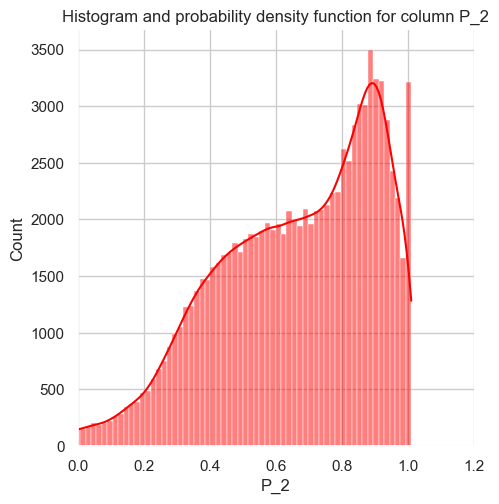

<Figure size 1000x1000 with 0 Axes>

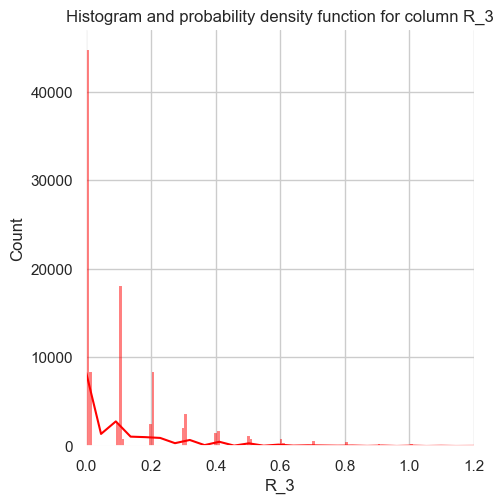

<Figure size 1000x1000 with 0 Axes>

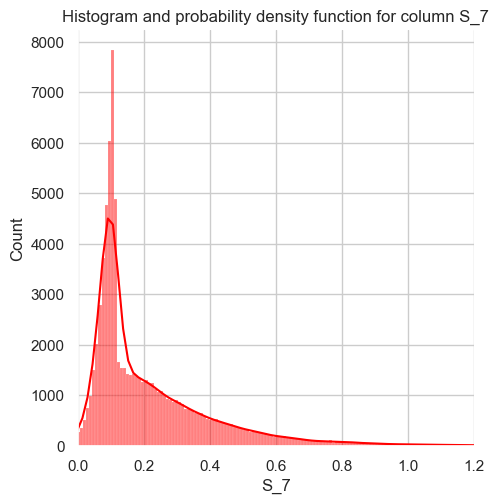

<Figure size 1000x1000 with 0 Axes>

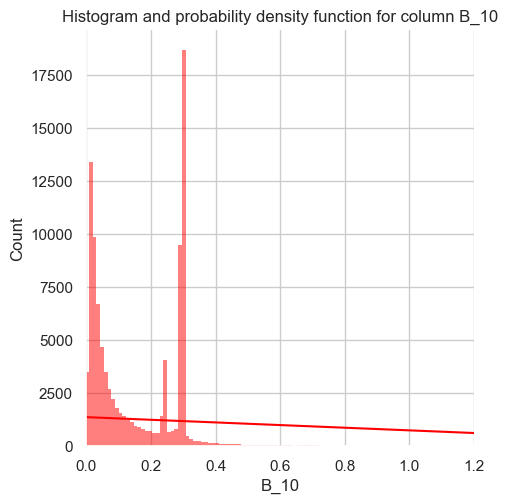

<Figure size 1000x1000 with 0 Axes>

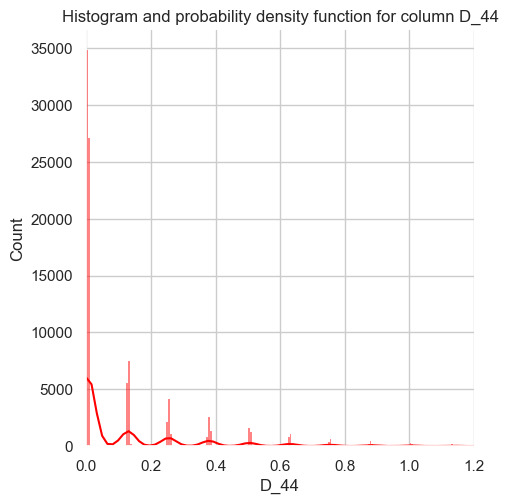

In [18]:
#PLot distplot for top iv column of each category kde and histogram


for i in range(5):
    plt.figure(figsize=(10,10))
    sns.displot(df[IV_top_per_cat1[i]],palette='Set2',kde=True,color='red')
    #sns.displot(df[IV_top_per_cat1[i]],palette='Set2',kind="kde",color='red',ax=ax)
    plt.title("Histogram and probability density function for column "+IV_top_per_cat1[i])
    plt.xlim(0,1.2)
    plt.show()

#Similarly plot kdes it gives pdf of the variable in the same graph automatically done

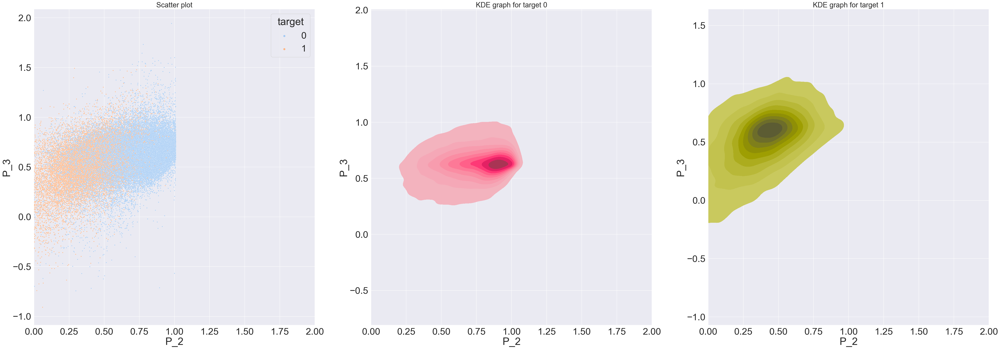

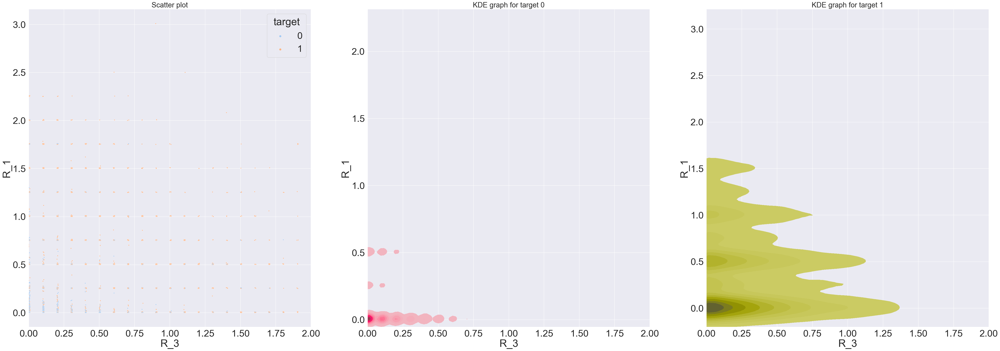

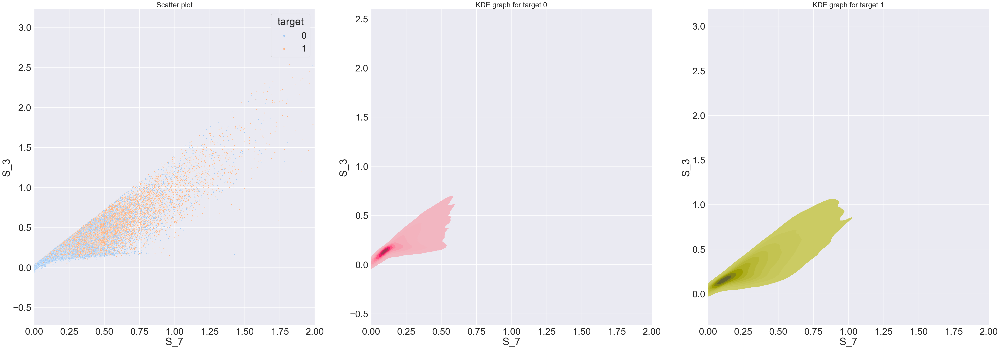

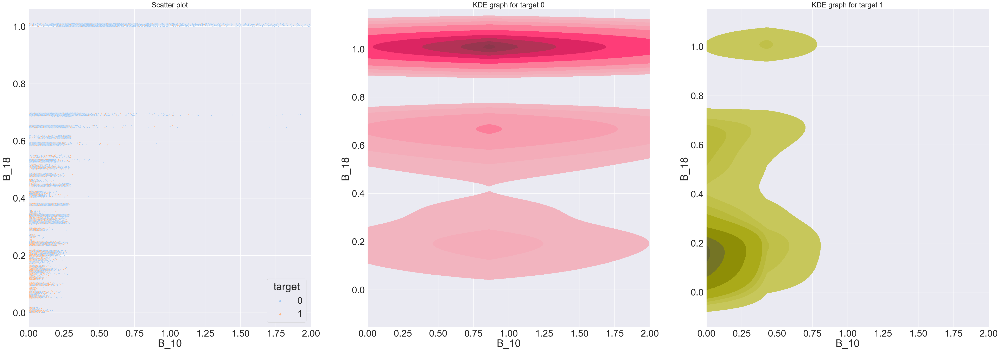

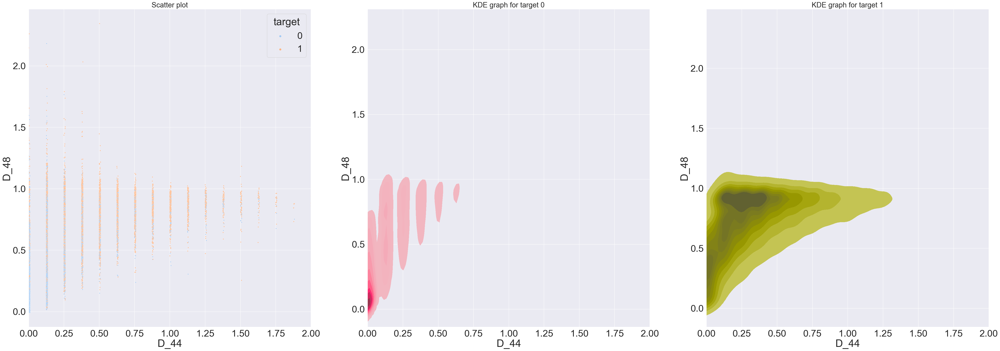

In [19]:
#Scatter plot for two highest corelated in each category
sns.set(font_scale=3)
for i in range(5):

    fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(60,20))

    g1=sns.scatterplot(x=IV_top_per_cat1[i],y=IV_top_per_cat2[i],data=df,hue=df['target'],sizes=10,palette="pastel",ax=ax1,s=10)
    ax1.set_title("Scatter plot", fontsize=25)
    g1.set(xlim=(0,2))
    g2=sns.kdeplot(x=IV_top_per_cat1[i],y=IV_top_per_cat2[i],data=t0,sizes=10,palette="pastel",ax=ax2,color='pink',shade=True)
    ax2.set_title("KDE graph for target 0", fontsize=25)
    g2.set(xlim=(0,2))
    g3=sns.kdeplot(x=IV_top_per_cat1[i],y=IV_top_per_cat2[i],data=t1,sizes=10,palette="pastel",ax=ax3,color='yellow',shade=True)
    ax3.set_title("KDE graph for target 1", fontsize=25)
    g3.set(xlim=(0,2))
    
    plt.show()

In [ ]:
#     sns.set(font_scale=1)
#     g1=sns.scatterplot(x=IV_top_per_cat1[4],y=IV_top_per_cat2[4],data=df,hue=df['target'],palette="pastel",s=10)
#     plt.title("Scatter plot")
#     plt.figure(figsize=(20,20))
#     g1.set(xlim=(0,2))
#     plt.show()

In [20]:
# g2=sns.kdeplot(x=IV_top_per_cat1[0],y=IV_top_per_cat2[0],data=t1,sizes=10,palette="pastel",color='yellow',shade=True)
# plt.title("KDE graph for target 1", fontsize=25)
# plt.figure(figsize=(20,20))
# g2.set(xlim=(0,2))
# g2.set(ylim=(0,2))

# plt.show()

NameError: name 'rows' is not defined

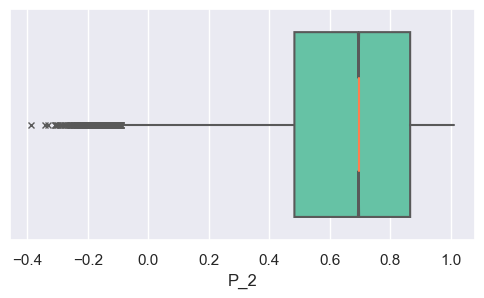

In [21]:
# for i in range(5):
#     sns.boxplot(x=IV_top_per_cat1[i], data=df,palette="Set2")
#     ttl="Boxplot for column"+IV_top_per_cat1[i]
#     plt.title(ttl)
#     plt.show()
#     cols = 3
#rows = 3
#num_cols = 2
#fig = plt.figure(figsize= (100,50))
sns.set(font_scale=1)
for i in range (5):
    plt.figure(figsize=(6,3))
    sns.boxplot(x=IV_top_per_cat1[i], data=df,palette="Set2",color='blue',notch=True, showcaps=False,saturation=3,medianprops={"color":"coral"},flierprops={"marker":"x"})
    #ttl="Boxplot for column"+IV_top_per_cat1[i]
    ax=fig.add_subplot( rows, cols, i+1)
    plt.xlabel("Values for "+IV_top_per_cat1[i])
    ttl="Boxplot for column "+IV_top_per_cat1[i]
    plt.title(ttl)
    plt.show()
 


In [22]:
cols = 3
rows = 3
num_cols = dod.select_dtypes(exclude='object').columns
fig = plt.figure(figsize= (15,9))
sns.set(rc={'axes.facecolor':'white','figure.facecolor':'white','grid.color':'0.8'})
for i, col in enumerate(num_cols):
    

    
    ax=fig.add_subplot( rows, cols, i+1)
    ax.patch.set_edgecolor('black')
    ax.patch.set_linewidth('2')
    ax.set_title("Boxplot for column "+IV_top_per_cat1[i], fontsize=12)
    sns.boxplot(x=IV_top_per_cat1[i], data=df,palette="Set2",color='blue',notch=True, showcaps=True,saturation=3,medianprops={"color":"coral"})
    
fig.tight_layout()  
plt.show()

NameError: name 'dod' is not defined

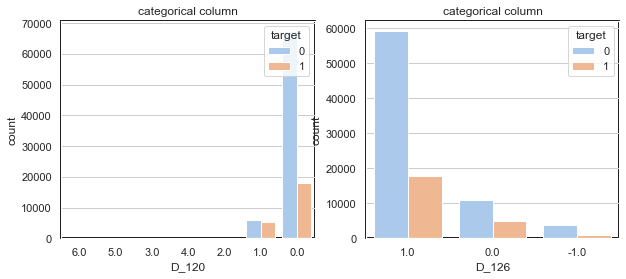

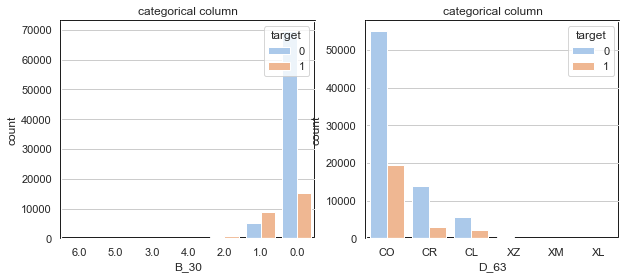

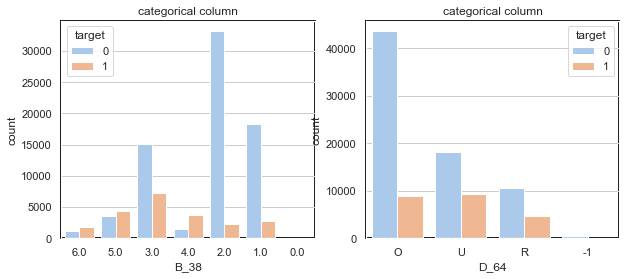

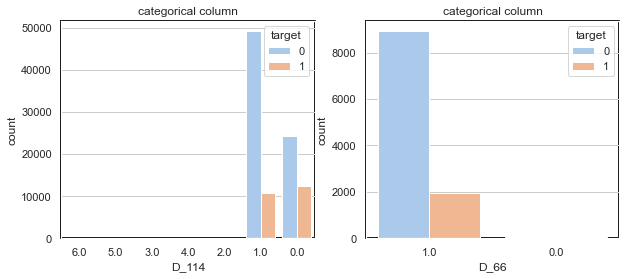

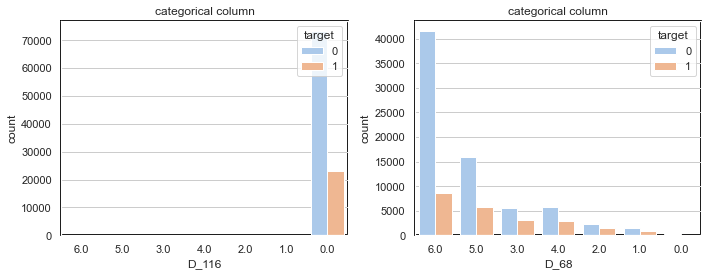

In [346]:
cat_cols = [ 'D_120','B_30', 'B_38', 'D_114', 'D_116', 'D_117']
cat_cols2=['D_126', 'D_63', 'D_64', 'D_66', 'D_68']

for i in range(5):
    col=cat_cols[i]
    coll=cat_cols2[i]
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    #fig.suptitle(col, size = 14)
    sns.countplot(ax = axes[0], data = df,
                  x = col, order = t, palette= "pastel",hue='target')
    axes[0].set_title('categorical column', size = 12)
    tt=df[coll].value_counts().index
    sns.countplot(ax = axes[1], data = df,
                  x = coll, order = tt, palette= "pastel",hue='target')
    axes[0].patch.set_edgecolor('black')
    axes[0].patch.set_linewidth('2')
    axes[1].patch.set_edgecolor('black')
    axes[1].patch.set_linewidth('2')
    axes[1].set_title('categorical column', size = 12)
plt.tight_layout()
plt.show()

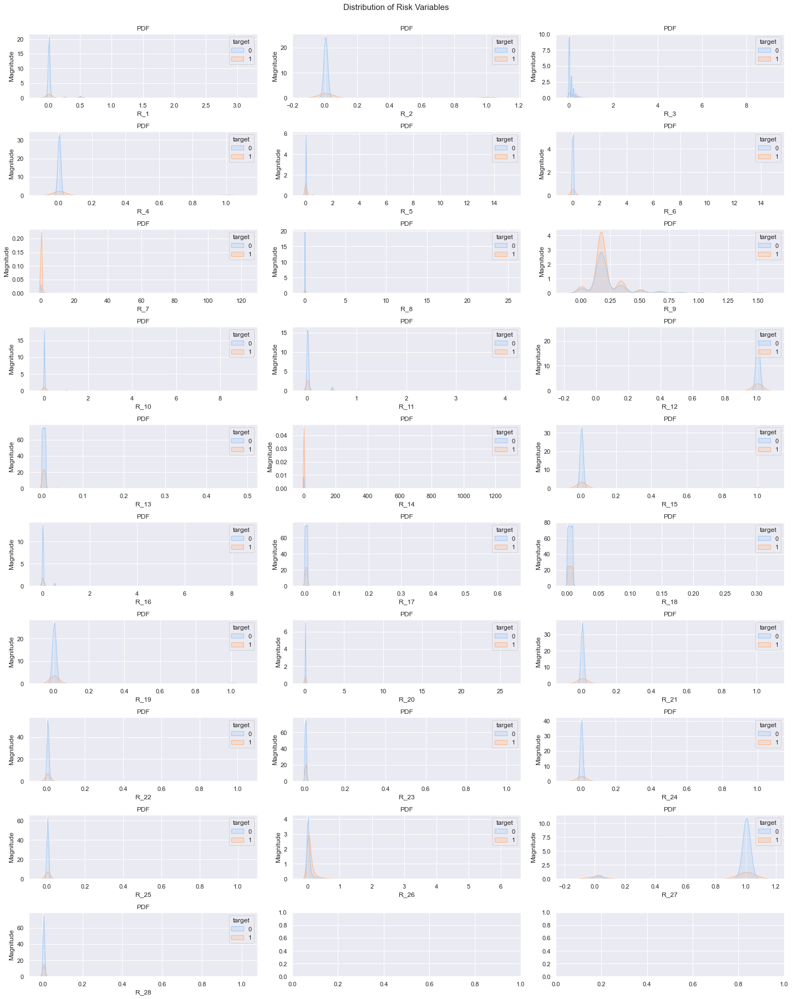

In [66]:
fig, axes = plt.subplots(10, 3, figsize = (20,25))
fig.suptitle('Distribution of Risk Variables',fontsize=15, x = 0.5, y = 1)
for i, ax in enumerate(axes.reshape(-1)):
    if i < len(df_R):
        sns.kdeplot(x = df_R[i], hue ='target', data = df,common_norm=True, fill = True, palette ="pastel",ax = ax,legend=True)
        ax.xaxis.get_label()
        ax.set_title('PDF', size = 12)
        ax.set_ylabel('Magnitude')
plt.tight_layout()
plt.show()

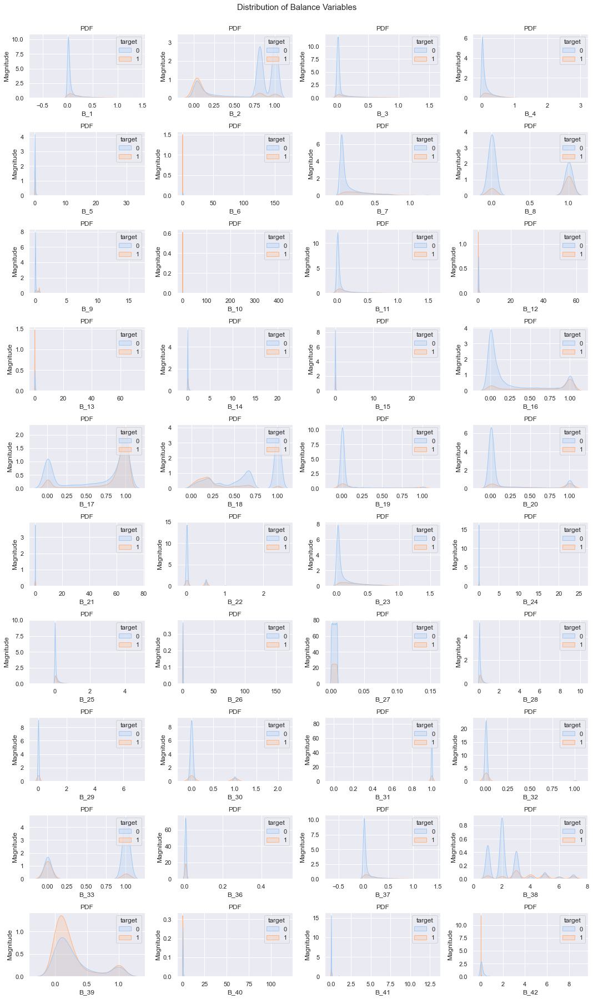

In [67]:
fig, axes = plt.subplots(10, 4, figsize = (15,25))
fig.suptitle('Distribution of Balance Variables',fontsize=15, x = 0.5, y = 1)
for i, ax in enumerate(axes.reshape(-1)):
    if i < len(df_B):
        sns.kdeplot(x = df_B[i], hue ='target', data = df, fill = True,common_norm=True, palette ="pastel",ax = ax,legend=True)
        ax.xaxis.get_label()
        ax.set_title('PDF', size = 12)
        ax.set_ylabel('Magnitude')
plt.tight_layout()
plt.show()

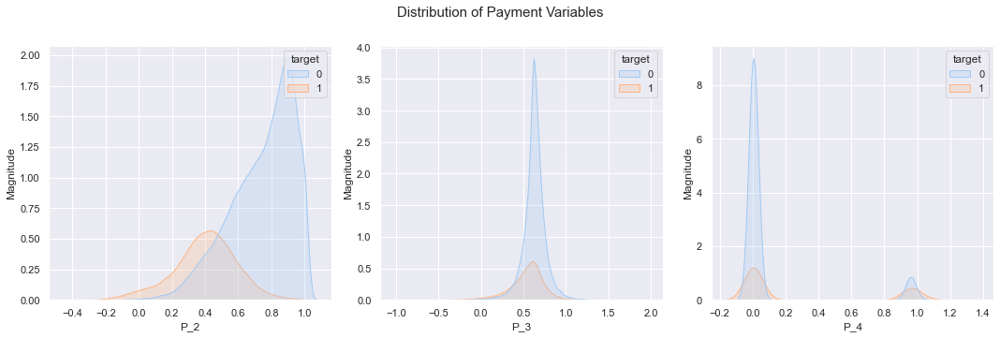

In [62]:
fig, axes = plt.subplots(1, 3, figsize = (15,5))
fig.suptitle('Distribution of Payment Variables',fontsize=15, x = 0.5, y = 1)
for i, ax in enumerate(axes.reshape(-1)):
    if i < len(df_P):
        sns.kdeplot(x = df_P[i], hue ='target', data = df, fill = True,common_norm=True, palette ="pastel",ax = ax,legend=True)
        ax.xaxis.get_label()
        ax.set_title('PDF', size = 12)
        ax.set_ylabel('Magnitude')
plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(8, 3, figsize = (15,20))
fig.suptitle('Distribution of spend Variables',fontsize=15, x = 0.5, y = 1)
for i, ax in enumerate(axes.reshape(-1)):
    if i < len(df_S)-1:
        sns.kdeplot(x = df_S[i+1], hue ='target', data = df, fill = True,common_norm=True, palette ="pastel",ax = ax,legend=True)
        ax.xaxis.get_label()
        ax.set_title('PDF', size = 12)
        ax.set_ylabel('Magnitude')
plt.tight_layout()
plt.show()

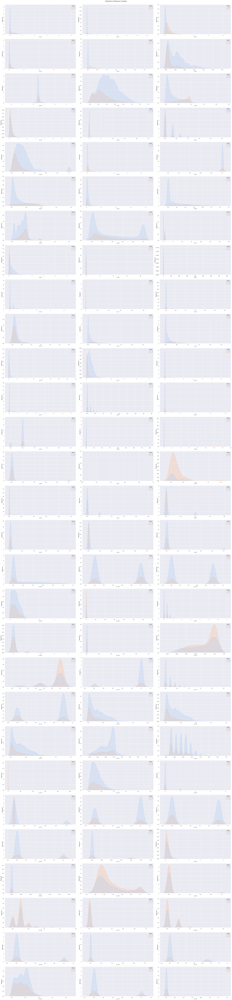

In [272]:
fig, axes = plt.subplots(29, 3, figsize = (35,150))
fig.suptitle('Distribution of Deliquency Variables',fontsize=15, x = 0.5, y = 1)
dff=df
dff.drop(['D_116', 'D_117', 'D_120','D_126', 'D_63', 'D_64', 'D_66', 'D_68'], axis=1)

#df_D.remove('D_63')
# df_D.remove('D_116')
# df_D.remove('D_117')
# df_D.remove('D_120')
# df_D.remove('D_126')
#df_D.remove('D_63')
# df_D.remove('D_64')
# df_D.remove('D_66')
# df_D.remove('D_68')
for i, ax in enumerate(axes.reshape(-1)):
    if i < len(df_D):
        sns.kdeplot(x = df_D[i], hue ='target', data = df,common_norm=True, fill = True, palette ="pastel",ax = ax,legend=True)
        ax.xaxis.get_label()
        ax.set_title('PDF', size = 12)
        ax.set_ylabel('Magnitude')
plt.tight_layout()
plt.show()

In [2]:
class transformation:
    def __init__(self,transformed_data,pivot_tables):
        self.all_cols=transformed_data.columns[1:-1]
        self.transformed_data=transformed_data.to_numpy()
        self.pivot_tables=pivot_tables.to_numpy()
        """
        Getting all availables columns from the data matrix
        """
        self.cols=[]
        for i in self.all_cols:
            if(i[-4:]=="band"):
                self.cols.append(i)
        self.imp_cols={}
        self.first_col=self.pivot_tables[:,0]
        self.final_df=[]
        """
        Choosing the columns where IV is greater than 0.1
        """
        self.iv_cols={}
        for i in self.cols:
            ind=np.where(self.first_col==i)[0]
            nex=ind+1
            while self.first_col[nex]!="Grand Total" and nex<len(self.first_col):
                nex+=1
            iv=self.pivot_tables[nex,10][0]
            self.iv_cols[i]=iv
            if(iv>0.1):
                self.imp_cols[i]=iv     
            
    def get_data(self):
        self.transformed_data=self.transformed_data[0:-1,:]
        rows=self.transformed_data.shape[0]
        cols=len(self.imp_cols)
        self.final_df=np.zeros(shape=(rows,cols))
        ind=0
        for i in self.imp_cols:
            index1=np.where(self.all_cols==i)[0]
            index1+=1
            index=np.where(self.first_col==i)[0]
            st=index+1
            dict={}
            while self.first_col[st]!="(blank)":
                a=self.pivot_tables[st,0][0]
                b=self.pivot_tables[st,9][0]
                dict[a]=b
                st+=1
            self.imp_cols[i]=dict
            for j in range(rows):
                a1=self.transformed_data[j,index1][0]
                try:
                    a2=dict[a1]
                except:
                    a2=dict['blank']
                self.final_df[j,ind]=a2
            ind+=1
        return self.final_df  

In [6]:

transformed_data1=pd.read_excel("pivot_tables.xlsx",sheet_name='training_data1')
pivot_tables1=pd.read_excel("pivot_tables.xlsx",sheet_name='pivot1')
pivot_tables1.dropna(axis=0,inplace=True,how='all')

transformed_data2=pd.read_excel("pivot_tables.xlsx",sheet_name='training_data2')
pivot_tables2=pd.read_excel("pivot_tables.xlsx",sheet_name='pivot2')
pivot_tables2.dropna(axis=0,inplace=True,how='all')

transformed_data3=pd.read_excel("pivot_tables.xlsx",sheet_name='training_data3')
pivot_tables3=pd.read_excel("pivot_tables.xlsx",sheet_name='pivot3')
pivot_tables3.dropna(axis=0,inplace=True,how='all')

transformed_data4=pd.read_excel("pivot_tables.xlsx",sheet_name='training_data4')
pivot_tables4=pd.read_excel("pivot_tables.xlsx",sheet_name='pivot4')
pivot_tables4.dropna(axis=0,inplace=True,how='all')


In [7]:
obj1=transformation(transformed_data1, pivot_tables1)
obj2=transformation(transformed_data2, pivot_tables2)
obj3=transformation(transformed_data3, pivot_tables3)
obj4=transformation(transformed_data4, pivot_tables4)

In [8]:
customer_col=transformed_data1.to_numpy()
customer_col=customer_col[0:-1,0]
target=transformed_data1.to_numpy()
target=target[0:-1,-1]
data1=obj1.get_data()
data2=obj2.get_data()
data3=obj3.get_data()
data4=obj4.get_data()
final_data=np.column_stack((data1,data2))
final_data=np.column_stack((final_data,data3))
final_data=np.column_stack((final_data,data4))
customer_col=np.reshape(customer_col,(len(customer_col),1))
target=np.reshape(target,(len(target),1))
final_data=np.column_stack((customer_col,final_data))
final_data=np.column_stack((final_data,target))
columns=['Customer_id']
columns.extend(obj1.imp_cols.keys())
columns.extend(obj2.imp_cols.keys())
columns.extend(obj3.imp_cols.keys())
columns.extend(obj4.imp_cols.keys())
columns.append('target')
df=pd.DataFrame(final_data,columns=columns)
df.to_csv("Final_Data.csv",index=False)

In [9]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
df=pd.read_csv("Final_Data.csv")
data=df.to_numpy()
data_x=data[:,1:-1]
target=data[:,-1]
for i in range(len(target)):
    if target[i]==0:
        target[i]="N-Default"
    else:
        target[i]="Default"
train_x,test_x,train_y,test_y=train_test_split(data_x,target,test_size=0.3)
print(train_x)
print(train_x.shape)

[[-1.954492323614348 -0.3398573264875564 0.5946407773978429 ...
  0.2366688185437011 -0.6691019692235101 -0.4727212931145917]
 [-1.954492323614348 -0.6487515607580634 -0.2492432610573152 ...
  -1.149827873229607 -1.8662267557710095 -0.4727212931145917]
 [-1.954492323614348 -0.3398573264875564 -0.2264923181715587 ...
  -2.2392892688359205 -2.474884600276239 0.444301360516873]
 ...
 [-3.845728711450618 -0.6487515607580634 -0.2457670516492203 ...
  -2.2392892688359205 -1.8662267557710095 -0.4727212931145917]
 [1.7090706297749692 0.8010771635552605 0.5946407773978429 ...
  0.2366688185437011 0.4410052604498723 0.444301360516873]
 [-3.845728711450618 -0.6487515607580634 -0.2492432610573152 ...
  -2.2392892688359205 -1.8662267557710095 -0.4727212931145917]]
(69811, 84)


In [10]:
print(train_y)
print(train_y.shape)

['N-Default' 'N-Default' 'N-Default' ... 'N-Default' 'Default' 'N-Default']
(69811,)


In [11]:
dt=DecisionTreeClassifier(max_depth=8)
dt.fit(train_x,train_y)
from sklearn.metrics import accuracy_score
pred_y=dt.predict(test_x)
print("Decision Tree",end=" ")
print(accuracy_score(pred_y,test_y))
from sklearn.ensemble import RandomForestClassifier
rn=RandomForestClassifier(n_estimators=100)
rn.fit(train_x,train_y)
pred_y=rn.predict(test_x)
print("Random Forest",end=" ")
print(accuracy_score(pred_y,test_y))
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(train_x,train_y)
pred_y=lr.predict(test_x)
print("Logistic Regression ",end=" ")
print(accuracy_score(pred_y,test_y))

Decision Tree 0.8530365319696513
Random Forest 0.8677763294227748
Logistic Regression  0.8661051505732144


In [205]:
dict={}
dict.update(obj1.iv_cols)
dict.update(obj2.iv_cols)
dict.update(obj3.iv_cols)
dict.update(obj4.iv_cols)
sorted_dict = sorted(dict.items(), key=lambda x:x[1], reverse=True)
top_10_iv={}
for i in sorted_dict:
    if(len(top_10_iv)==10):
        break
    top_10_iv[i]=sorted_dict
top_10_cols=top_10_iv.keys()

In [206]:
top_10_cols=[i[0] for i in top_10_cols]
print(top_10_cols)

['P_2_band', 'D_48_band', 'B_18_band', 'B_10_band', 'D_75_band', 'B_33_band', 'B_7_band', 'B_6_band', 'B_23_band', 'D_61_band']


In [207]:
raw_data=pd.read_csv('train_data_new.csv')

In [208]:
from math import *

In [209]:
def top_bands(raw_data):
    list_data=[]
    cuts=[]
    pp=[i for i in range(10,110,10)]
    x=np.nanpercentile(raw_data,10)
    for i in pp:
        x=np.nanpercentile(raw_data,i)
        cuts.append(x)
    cuts=np.unique(cuts)
    for j in range(len(raw_data)):
        if isnan(raw_data.loc[j]):
            list_data.append('NaN')
            continue
        for x in range(len(cuts)):
            if raw_data.loc[j]<cuts[x]:
                string=x
                list_data.append(string)
                break
    return pd.Series(list_data)

In [210]:
tr_df=raw_data
for i in top_10_cols:
    print(attr)
    attr=i[0:-5]
    data_frame=top_bands(raw_data[attr])
    tr_df[attr].loc[:]=data_frame

P_2
P_2
D_48
B_18
B_10
D_75
B_33
B_7
B_6
B_23


In [203]:
no=tr_df.groupby(['target'])['target'].count().to_dict()
no_0=no[0]
no_1=no[1]

In [211]:
woe={}
for col in top_10_cols:
    col=col[0:-5]
    woe[col]={}
    dic=tr_df.groupby([col])['target'].count().to_dict()
    count_1=tr_df.groupby([col])['target'].sum().to_dict()
    count_0={}
    for i in count_1:
        count_0[i]=dic[i]-count_1[i]
        probab_non_events=count_0[i]/no_0
        probab_events=count_1[i]/no_1
        woe[col][i]=(probab_events-probab_non_events)*(log(probab_events)-log(probab_non_events))
print(woe)
    

{'P_2': {0: 0.4431362276679127, 1: 0.21707592151347305, 2: 0.10116990069906416, 3: 0.006091360261794366, 4: 0.015711253314781484, 5: 0.08381567544605441, 6: 0.14962626357957126, 7: 0.1884722908078346, 8: 0.20477485296308123, 9: 0.21677390265665727, 'NaN': 1.2532413730660269e-05}, 'D_48': {0: 0.020245226819238748, 1: 0.018348252713706492, 2: 0.017441020325792242, 3: 0.01367649693630193, 4: 0.0037771928137777847, 5: 0.0005107932423730669, 6: 0.003717375727506183, 7: 0.017785917995010305, 8: 0.03427603113535279, 9: 0.06927753836355878, 'NaN': 0.008793361517221666}, 'B_18': {0.0: 0.10684972152915385, 1.0: 0.09581779247304639, 2.0: 0.06693823349182702, 3.0: 0.005775024322789899, 4.0: 0.003757300501527355, 5.0: 0.01025118718199238, 6.0: 0.050401409594822845, 7.0: 0.0717150338760762, 8.0: 0.07261661904497267, 9.0: 0.07016793302094089}, 'B_10': {0.0: 0.02705314272184409, 1.0: 0.030615061056386696, 2.0: 0.016502767054093266, 3.0: 0.007396330595983611, 4.0: 0.00025738864449270936, 5.0: 0.0050791

In [212]:
print(woe['P_2']['NaN'])

1.2532413730660269e-05


In [213]:
final_data=pd.read_csv('Final_Data.csv')
final_data_new=final_data

In [216]:
for i in top_10_cols:
    attr=i[0:-5]
    print(attr)
    for j in range(len(tr_df[attr])-1):
        try:
            if isnan(tr_df[attr].loc[j]):
                tr_df[attr].loc[j]=woe[attr]['NaN']
            else:
                tr_df[attr].loc[j]=woe[attr][tr_df[attr].loc[j]]
        except:
            tr_df[attr].loc[j]=woe[attr]['NaN']

P_2
D_48
B_18
B_10
D_75
B_33
B_7
B_6
B_23
D_61


In [218]:
final_data_new=final_data
for i in top_10_cols:
    attr=i[0:-5]
    final_data_new[i]=tr_df[attr]

In [219]:
final_data_new.to_csv('Final_Data_new.csv')